# Exploratory cerium plots with base MWM DR19 data

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from scipy import stats

import paths
from utils import get_color_list, get_bin_centers
from mwm_sample import abundance_ratio

In [2]:
plt.style.use(paths.styles / 'notebook.mplstyle')

In [3]:
mwm_rgb = pd.read_csv(paths.data / 'MWM' / 'MWM_RGB.csv')
mwm_rgb

/var/folders/_s/lknhlnjn1g1cj388brpgztf80000gn/T/ipykernel_10320/610113364.py:1: DtypeWarning: Columns (44) have mixed types. Specify dtype option on import or set low_memory=False.
  mwm_rgb = pd.read_csv(paths.data / 'MWM' / 'MWM_RGB.csv')



,sdss_id,sdss4_apogee_id,gaia_dr2_source_id,gaia_dr3_source_id,tic_v8_id,healpix,lead,version_id,catalogid,catalogid21,catalogid25,catalogid31,n_associated,n_neighborhood,sdss4_apogee_target1_flags,sdss4_apogee_target2_flags,sdss4_apogee2_target1_flags,sdss4_apogee2_target2_flags,sdss4_apogee2_target3_flags,sdss4_apogee_member_flags,sdss4_apogee_extra_target_flags,ra,dec,l,b,plx,e_plx,pmra,e_pmra,pmde,e_pmde,gaia_v_rad,gaia_e_v_rad,g_mag,bp_mag,rp_mag,j_mag,e_j_mag,h_mag,e_h_mag,...,raw_e_na_h,raw_nd_h,raw_e_nd_h,raw_ni_h,raw_e_ni_h,raw_n_h,raw_e_n_h,raw_o_h,raw_e_o_h,raw_p_h,raw_e_p_h,raw_si_h,raw_e_si_h,raw_s_h,raw_e_s_h,raw_ti_h,raw_e_ti_h,raw_ti_2_h,raw_e_ti_2_h,raw_v_h,raw_e_v_h,age,e_p_age,e_n_age,training_density,BITMASK,mg_fe,e_mg_fe,ce_mg,e_ce_mg,c_n,e_c_n,gal_r,gal_phi,gal_z,galpy_r_guide,galpy_z_max,galpy_ecc,galpy_E,galpy_Lz
0,54381291,NaN,421495278551818624,421495278551818624,403218924,16384,tic_v8,25,27021597850714872,4291430952,27021597850714872,63050394783202026,1,1,0,0,0,0,0,0,0,4.281347,56.316986,118.158530,-6.236419,0.132960,0.019461,-1.340264,0.017075,-0.547603,0.018772,-92.704994,1.575591,14.488654,15.619171,13.432241,11.725,0.023,10.852,0.030,...,0.002357,-0.248470,0.002388,-0.273520,0.002394,-0.096340,0.006065,-0.256945,0.005098,-0.030756,0.002355,-0.229907,0.005158,-0.272022,0.005070,-0.241465,0.005131,NaN,NaN,-0.60904,0.002446,4.180361,6.060120,2.300601,4.224020e+09,2,-0.002081,0.023026,0.099242,0.051693,-0.256311,0.024055,12.439019,153.313414,-0.663968,12.222205,0.703732,0.014642,-25272.458243,2564.722834
1,54381397,NaN,421505552113500800,421505552113500800,369831391,16384,tic_v8,25,27021597850723334,4291439436,27021597850723334,63050394783205413,1,0,0,0,0,0,0,0,0,4.066874,56.422930,118.054560,-6.115390,0.229285,0.012541,0.064405,0.011183,-1.219537,0.012213,-30.982110,0.716571,13.574258,14.658734,12.552815,10.951,0.022,10.059,0.029,...,0.002587,0.112000,0.002563,0.036911,0.002583,0.151554,0.006402,-0.001994,0.005574,-0.046579,0.002605,0.024721,0.005627,0.025365,0.005629,0.064275,0.005717,NaN,NaN,-0.10947,0.002593,3.591182,5.442886,1.599198,9.365982e+09,2,-0.020224,0.023876,0.231965,0.052136,-0.198570,0.024895,10.447799,161.379103,-0.379658,10.506503,0.506564,0.143261,-30486.022363,2245.499245
2,54381405,NaN,421506067509558016,421506067510359808,369831290,16384,tic_v8,25,27021597850724078,4291440182,27021597850724078,63050394783205570,1,0,0,0,0,0,0,0,0,4.092195,56.472700,118.075340,-6.067999,0.287407,0.024561,-2.392000,0.022697,-0.577341,0.025753,-116.702140,0.209447,12.253111,13.457909,11.174816,9.449,0.022,8.454,0.027,...,0.000832,-0.497700,0.000833,-0.363770,0.000831,-0.111530,0.002705,-0.313007,0.002415,-0.505860,0.000833,-0.325725,0.002409,-0.252171,0.002452,-0.229592,0.002469,NaN,NaN,-0.56504,0.000839,2.244489,4.068136,0.336673,4.764315e+08,2,-0.003506,0.018109,0.307138,0.049115,-0.332730,0.018693,10.274266,162.308315,-0.351110,8.760375,0.532926,0.224887,-36536.627138,1911.999891
3,54381758,2M00204981+5625073,421540152367477248,421540152367477248,403307163,16385,gaia_dr3_source,31,63050394783216344,4291448641,27021597850732513,63050394783216344,1,0,0,0,18452,0,0,0,0,5.207570,56.418667,118.683350,-6.200385,0.137260,0.013549,-1.054348,0.011520,-2.354721,0.011972,-77.190440,0.746768,13.690668,14.897005,12.616476,10.858,0.021,9.867,0.028,...,0.002356,-0.367640,0.002333,-0.569730,0.002361,-0.349090,0.006225,-0.505721,0.005178,-0.428090,0.002331,-0.442630,0.005303,0.347810,0.006222,-0.617411,0.005021,NaN,NaN,-0.98039,0.002427,5.358717,7.462926,3.170341,1.246616e+09,2,0.069980,0.023265,-0.043178,0.051782,-0.236124,0.024095,12.096207,154.781406,-0.610219,11.985890,1.989756,0.028805,-25026.240407,2521.123098
4,54381959,2M00224114+5636475,421557607115380608,421557607115380608,403393455,16025,gaia_dr3_source,31,63050394783222145,4291878516,27021597851161007,63050394783222145,1,0,0,0,18450,0,0,0,0,5.671459,56.613155,118.961630,-6.036785,0.534588,0.018426,-3.865155,0.014910,-3.119882,0.017192,-76.100770,0.247

In [4]:
mwm_rgb['ce_fe'], mwm_rgb['e_ce_fe'] = abundance_ratio(mwm_rgb, 'ce', 'fe')
mwm_rgb

,sdss_id,sdss4_apogee_id,gaia_dr2_source_id,gaia_dr3_source_id,tic_v8_id,healpix,lead,version_id,catalogid,catalogid21,catalogid25,catalogid31,n_associated,n_neighborhood,sdss4_apogee_target1_flags,sdss4_apogee_target2_flags,sdss4_apogee2_target1_flags,sdss4_apogee2_target2_flags,sdss4_apogee2_target3_flags,sdss4_apogee_member_flags,sdss4_apogee_extra_target_flags,ra,dec,l,b,plx,e_plx,pmra,e_pmra,pmde,e_pmde,gaia_v_rad,gaia_e_v_rad,g_mag,bp_mag,rp_mag,j_mag,e_j_mag,h_mag,e_h_mag,...,raw_e_nd_h,raw_ni_h,raw_e_ni_h,raw_n_h,raw_e_n_h,raw_o_h,raw_e_o_h,raw_p_h,raw_e_p_h,raw_si_h,raw_e_si_h,raw_s_h,raw_e_s_h,raw_ti_h,raw_e_ti_h,raw_ti_2_h,raw_e_ti_2_h,raw_v_h,raw_e_v_h,age,e_p_age,e_n_age,training_density,BITMASK,mg_fe,e_mg_fe,ce_mg,e_ce_mg,c_n,e_c_n,gal_r,gal_phi,gal_z,galpy_r_guide,galpy_z_max,galpy_ecc,galpy_E,galpy_Lz,ce_fe,e_ce_fe
0,54381291,NaN,421495278551818624,421495278551818624,403218924,16384,tic_v8,25,27021597850714872,4291430952,27021597850714872,63050394783202026,1,1,0,0,0,0,0,0,0,4.281347,56.316986,118.158530,-6.236419,0.132960,0.019461,-1.340264,0.017075,-0.547603,0.018772,-92.704994,1.575591,14.488654,15.619171,13.432241,11.725,0.023,10.852,0.030,...,0.002388,-0.273520,0.002394,-0.096340,0.006065,-0.256945,0.005098,-0.030756,0.002355,-0.229907,0.005158,-0.272022,0.005070,-0.241465,0.005131,NaN,NaN,-0.60904,0.002446,4.180361,6.060120,2.300601,4.224020e+09,2,-0.002081,0.023026,0.099242,0.051693,-0.256311,0.024055,12.439019,153.313414,-0.663968,12.222205,0.703732,0.014642,-25272.458243,2564.722834,0.097161,0.048916
1,54381397,NaN,421505552113500800,421505552113500800,369831391,16384,tic_v8,25,27021597850723334,4291439436,27021597850723334,63050394783205413,1,0,0,0,0,0,0,0,0,4.066874,56.422930,118.054560,-6.115390,0.229285,0.012541,0.064405,0.011183,-1.219537,0.012213,-30.982110,0.716571,13.574258,14.658734,12.552815,10.951,0.022,10.059,0.029,...,0.002563,0.036911,0.002583,0.151554,0.006402,-0.001994,0.005574,-0.046579,0.002605,0.024721,0.005627,0.025365,0.005629,0.064275,0.005717,NaN,NaN,-0.10947,0.002593,3.591182,5.442886,1.599198,9.365982e+09,2,-0.020224,0.023876,0.231965,0.052136,-0.198570,0.024895,10.447799,161.379103,-0.379658,10.506503,0.506564,0.143261,-30486.022363,2245.499245,0.211740,0.049026
2,54381405,NaN,421506067509558016,421506067510359808,369831290,16384,tic_v8,25,27021597850724078,4291440182,27021597850724078,63050394783205570,1,0,0,0,0,0,0,0,0,4.092195,56.472700,118.075340,-6.067999,0.287407,0.024561,-2.392000,0.022697,-0.577341,0.025753,-116.702140,0.209447,12.253111,13.457909,11.174816,9.449,0.022,8.454,0.027,...,0.000833,-0.363770,0.000831,-0.111530,0.002705,-0.313007,0.002415,-0.505860,0.000833,-0.325725,0.002409,-0.252171,0.002452,-0.229592,0.002469,NaN,NaN,-0.56504,0.000839,2.244489,4.068136,0.336673,4.764315e+08,2,-0.003506,0.018109,0.307138,0.049115,-0.332730,0.018693,10.274266,162.308315,-0.351110,8.760375,0.532926,0.224887,-36536.627138,1911.999891,0.303631,0.047972
3,54381758,2M00204981+5625073,421540152367477248,421540152367477248,403307163,16385,gaia_dr3_source,31,63050394783216344,4291448641,27021597850732513,63050394783216344,1,0,0,0,18452,0,0,0,0,5.207570,56.418667,118.683350,-6.200385,0.137260,0.013549,-1.054348,0.011520,-2.354721,0.011972,-77.190440,0.746768,13.690668,14.897005,12.616476,10.858,0.021,9.867,0.028,...,0.002333,-0.569730,0.002361,-0.349090,0.006225,-0.505721,0.005178,-0.428090,0.002331,-0.442630,0.005303,0.347810,0.006222,-0.617411,0.005021,NaN,NaN,-0.98039,0.002427,5.358717,7.462926,3.170341,1.246616e+09,2,0.069980,0.023265,-0.043178,0.051782,-0.236124,0.024095,12.096207,154.781406,-0.610219,11.985890,1.989756,0.028805,-25026.240407,2521.123098,0.026801,0.048889
4,54381959,2M00224114+5636475,421557607115380608,421557607115380608,403393455,16025,gaia_dr3_source,31,63050394783222145,4291878516,27021597851161007,63050394783222145,1,0,0,0,18450,0,0,0,0,5.671459,56.613155,118.961630,-6.036785,0.534588,0.018426,-3.865155,0.014910,-3.119882,0.017192,-76.100770,0.247183,11.36

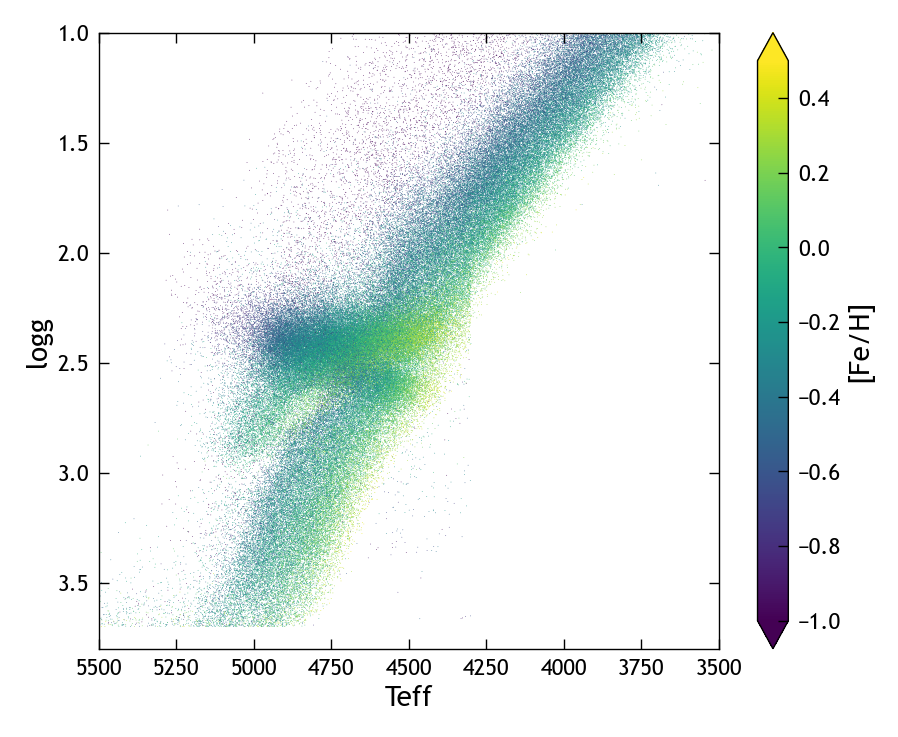

In [5]:
fig, ax = plt.subplots(figsize=(5, 4))
kwargs = dict(s=0.3, marker='.', rasterized=True, edgecolor='none')
pc = ax.scatter(mwm_rgb['teff'], mwm_rgb['logg'], c=mwm_rgb['fe_h'], vmin=-1, vmax=0.5, **kwargs)
fig.colorbar(pc, ax=ax, label='[Fe/H]', extend='both')
ax.set_xlim((5500, 3500))
ax.set_ylim((3.8, 1))
ax.set_xlabel('Teff')
ax.set_ylabel('logg')
plt.show()

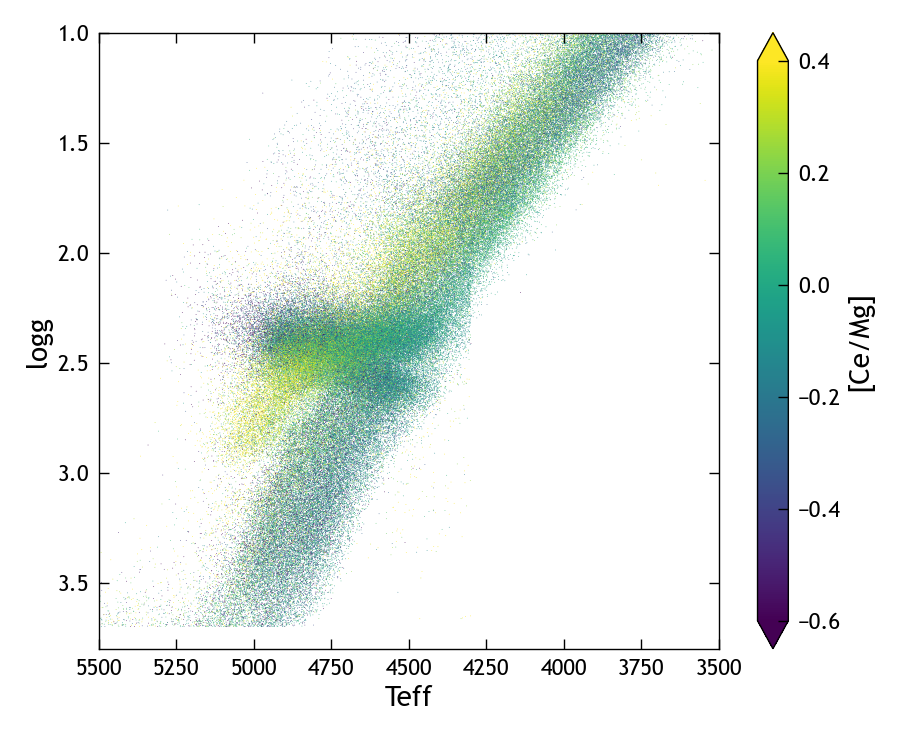

In [6]:
fig, ax = plt.subplots(figsize=(5, 4))
kwargs = dict(s=0.3, marker='.', rasterized=True, edgecolor='none')
pc = ax.scatter(mwm_rgb['teff'], mwm_rgb['logg'], c=mwm_rgb['ce_mg'], vmin=-0.6, vmax=0.4, **kwargs)
fig.colorbar(pc, ax=ax, label='[Ce/Mg]', extend='both')
ax.set_xlim((5500, 3500))
ax.set_ylim((3.8, 1))
ax.set_xlabel('Teff')
ax.set_ylabel('logg')
plt.show()

## Solar Neighborhood

In [7]:
mwm_rgb_local = mwm_rgb[
    (mwm_rgb['gal_r'] >= 7) &
    (mwm_rgb['gal_r'] < 9) &
    (mwm_rgb['gal_z'].abs() < 2)
]
mwm_rgb_local

,sdss_id,sdss4_apogee_id,gaia_dr2_source_id,gaia_dr3_source_id,tic_v8_id,healpix,lead,version_id,catalogid,catalogid21,catalogid25,catalogid31,n_associated,n_neighborhood,sdss4_apogee_target1_flags,sdss4_apogee_target2_flags,sdss4_apogee2_target1_flags,sdss4_apogee2_target2_flags,sdss4_apogee2_target3_flags,sdss4_apogee_member_flags,sdss4_apogee_extra_target_flags,ra,dec,l,b,plx,e_plx,pmra,e_pmra,pmde,e_pmde,gaia_v_rad,gaia_e_v_rad,g_mag,bp_mag,rp_mag,j_mag,e_j_mag,h_mag,e_h_mag,...,raw_e_nd_h,raw_ni_h,raw_e_ni_h,raw_n_h,raw_e_n_h,raw_o_h,raw_e_o_h,raw_p_h,raw_e_p_h,raw_si_h,raw_e_si_h,raw_s_h,raw_e_s_h,raw_ti_h,raw_e_ti_h,raw_ti_2_h,raw_e_ti_2_h,raw_v_h,raw_e_v_h,age,e_p_age,e_n_age,training_density,BITMASK,mg_fe,e_mg_fe,ce_mg,e_ce_mg,c_n,e_c_n,gal_r,gal_phi,gal_z,galpy_r_guide,galpy_z_max,galpy_ecc,galpy_E,galpy_Lz,ce_fe,e_ce_fe
5,54381962,NaN,421557744554456064,421557744554456064,403393481,16025,tic_v8,25,27021597851161095,4291878605,27021597851161095,63050394783222184,1,0,0,0,0,0,0,0,0,5.742822,56.604244,118.999880,-6.050017,0.821440,0.015876,0.628917,0.012940,-1.830616,0.015138,-18.534935,0.239032,11.354103,12.103177,10.509450,9.319,0.024,8.710,0.040,...,0.001049,-0.313000,0.001050,-0.008080,0.002878,-0.229804,0.002522,-0.203050,0.001035,-0.203386,0.002537,-0.167645,0.002555,-0.211464,0.002533,NaN,NaN,-0.663700,0.001118,3.394790,4.881764,1.851703,2.428216e+10,2,-0.000336,0.018339,0.240068,0.049276,-0.363630,0.019100,8.749783,173.281551,-0.101791,9.203993,0.110773,0.056668,-36782.995717,1997.815531,0.239731,0.048096
19,54382295,NaN,421589183715747968,421589183715747968,327577724,16024,tic_v8,25,27021597850733418,4291449550,27021597850733418,63050394783232639,1,0,0,0,0,0,0,0,0,4.838552,56.535748,118.494286,-6.059307,0.621352,0.014215,-3.073833,0.012066,-3.772152,0.013121,-45.908558,0.723333,12.989830,13.689755,12.176354,11.028,0.021,10.415,0.015,...,0.006257,-0.095072,0.005898,0.215100,0.018513,-0.058495,0.015028,0.013058,0.005792,-0.028770,0.015048,0.018060,0.015077,0.030780,0.015084,NaN,NaN,0.234640,0.005516,3.030060,4.292585,1.711423,7.087366e+09,2,0.074218,0.042107,0.103403,0.063575,-0.627790,0.047610,8.960581,171.306019,-0.140909,9.149293,0.271906,0.090468,-36733.511600,1987.280037,0.177620,0.051042
27,54382700,2M00200721+5700122,421625909974353280,421625914277199872,406762101,15668,gaia_dr3_source,31,63050394783245110,4291624784,27021597850908177,63050394783245110,1,0,0,0,18450,0,0,0,0,5.030085,57.003410,118.656975,-5.608164,0.953160,0.094454,0.615691,0.082540,0.105002,0.088784,-50.765010,0.271974,11.962486,12.695877,11.121562,9.934,0.019,9.289,0.028,...,0.000631,-0.013938,0.000636,0.200936,0.001665,-0.032826,0.001502,-0.163750,0.000640,0.028596,0.001521,0.001517,0.001512,0.052001,0.001529,NaN,NaN,-0.392900,0.000658,3.843687,5.414830,2.300601,2.121073e+10,2,-0.021466,0.016607,0.240566,0.048510,-0.295990,0.017012,8.711216,173.559819,-0.087171,7.993401,0.222569,0.090786,-42495.998512,1761.353614,0.219099,0.047857
60,54383757,2M00290801+5640111,421706109904337024,421706109904337024,320047050,16027,gaia_dr3_source,31,63050394783273185,4291910754,27021597851193160,63050394783273185,1,0,0,0,18450,0,0,0,0,7.283336,56.669773,119.854150,-6.068625,0.726696,0.052882,-3.875471,0.044998,-1.517545,0.050888,-47.622517,0.220848,12.007926,12.807559,11.132788,9.861,0.020,9.177,0.019,...,0.000333,0.160080,0.000338,0.488370,0.000795,0.123616,0.000703,0.076737,0.000340,0.158961,0.000708,0.089763,0.000700,0.239161,0.000724,NaN,NaN,-0.030697,0.000341,3.254509,4.657315,1.851703,1.653510e+10,2,-0.037233,0.015279,0.058323,0.047961,-0.442800,0.015455,8.849934,172.602995,-0.117191,9.054247,0.156097,0.105772,-37114.362010,1968.943847,0.021089,0.047683
73,54384509,2M00271056+5654556,421762352496488832,421762352496488832,319844954,15670,gaia_dr3_source,31,63050394783292573,4291900981,27021597851183410,63050394783292573,1,0,0,0,18450,0,0,0,0,6.794001,56.915436,119.608240,-5.799658,0.637712,0.012658,-2.168090,0.009422,-1.115449,0.011912,-53.026530,0.

In [8]:
def alpha_cut(feh):
    """Returns [Mg/Fe] cut as function of [Fe/H]."""
    return np.where(
        feh >= 0.0,
        0.1,
        0.1 - 0.13*feh
    )

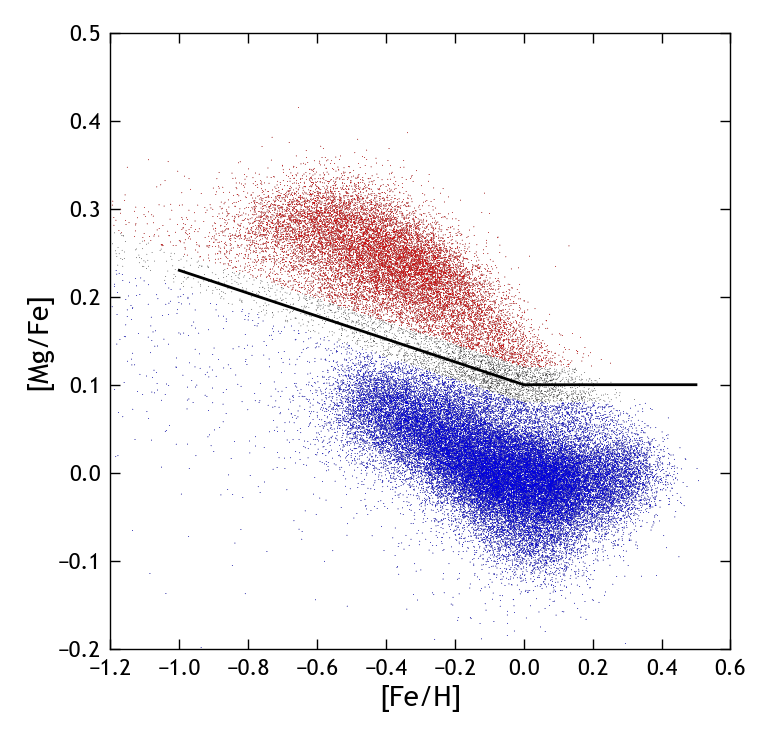

In [9]:
ms = 0.3

fig, ax = plt.subplots()
ax.scatter(
    mwm_rgb_local['fe_h'], mwm_rgb_local['mg_fe'], 
    s=ms, marker='.', rasterized=True, edgecolor='none', c='k'
)
feh_arr = np.arange(-1., 0.51, 0.1)
ax.plot(feh_arr, alpha_cut(feh_arr), c='k')
# high-alpha
alpha_buffer = 0.02
local_high_alpha = mwm_rgb_local[
    mwm_rgb_local['mg_fe'] > alpha_cut(mwm_rgb_local['fe_h']) + alpha_buffer
]
ax.scatter(
    local_high_alpha['fe_h'], local_high_alpha['mg_fe'], 
    s=ms, marker='.', rasterized=True, edgecolor='none', c='r'
)
# low-alpha
local_low_alpha = mwm_rgb_local[
    mwm_rgb_local['mg_fe'] < alpha_cut(mwm_rgb_local['fe_h']) - alpha_buffer
]
ax.scatter(
    local_low_alpha['fe_h'], local_low_alpha['mg_fe'], 
    s=ms, marker='.', rasterized=True, edgecolor='none', c='b'
)
ax.set_xlabel('[Fe/H]')
ax.set_ylabel('[Mg/Fe]')
ax.set_xlim((-1.2, 0.6))
ax.set_ylim((-0.2, 0.5))
plt.show()

In [14]:
def binned_medians(data, col, bin_col, bins=50):
    """
    Calculate median trends in bins of a second parameter.
    
    Parameters
    ----------
    col : str
        Data column corresponding to the first parameter, for which the
        intervals will be calculated in each bin.
    bin_col : str
        Data column corresponding to the second (binning) parameter.
    bins : int, optional
        The number of equal-size bins to divide the data along bin_col.
        The default is 50.
    
    Returns
    -------
    bin_centers : numpy.ndarray
        Center of each bin in bin_col.
    medians : numpy.ndarray
        Median values of col in each bin.
    """
    data = data.dropna(subset=col)
    bin_edges = np.linspace(data[bin_col].min(), data[bin_col].max(), bins+1)
    bin_centers = get_bin_centers(bin_edges)
    grouped = data.groupby(pd.cut(data[bin_col], bin_edges), observed=False)[col]
    return bin_centers, grouped.median().to_numpy()

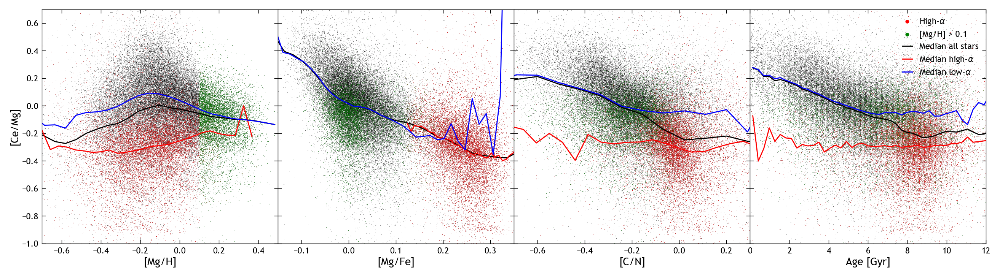

In [43]:
kwargs = dict(s=0.5, marker='.', rasterized=True, edgecolor='none')
local_metal_rich = mwm_rgb_local[mwm_rgb_local['mg_h'] > 0.1]

fig, axs = plt.subplots(1, 4, figsize=(16, 4), sharey=True, gridspec_kw={'wspace': 0.})

xcols = ['mg_h', 'mg_fe', 'c_n', 'age']
ycol = 'ce_mg'
for i, xcol in enumerate(xcols):
    # Full sample
    axs[i].scatter(mwm_rgb_local[xcol], mwm_rgb_local[ycol], c='k', **kwargs)
    # High-alpha
    axs[i].scatter(local_high_alpha[xcol], local_high_alpha[ycol], c='r', **kwargs, label=r'High-$\alpha$')
    # Local metal-rich
    axs[i].scatter(local_metal_rich[xcol], local_metal_rich[ycol], c='g', **kwargs, label='[Mg/H] > 0.1')
    # Median trends
    axs[i].plot(*binned_medians(mwm_rgb_local, ycol, xcol), 'k-', label=r'Median all stars')
    axs[i].plot(*binned_medians(local_high_alpha, ycol, xcol), 'r-', label=r'Median high-$\alpha$')
    axs[i].plot(*binned_medians(local_low_alpha, ycol, xcol), 'b-', label=r'Median low-$\alpha$')

axs[0].set_ylabel('[Ce/Mg]')
axs[0].set_xlabel('[Mg/H]')
axs[1].set_xlabel('[Mg/Fe]')
axs[2].set_xlabel('[C/N]')
axs[3].set_xlabel('Age [Gyr]')

axs[0].set_ylim((-1, 0.7))
axs[0].set_xlim((-0.7, 0.5))
axs[1].set_xlim((-0.15, 0.35))
axs[2].set_xlim((-0.7, 0.3))
axs[3].set_xlim((0, 12))

axs[3].legend(markerscale=10, loc='upper right')

plt.show()

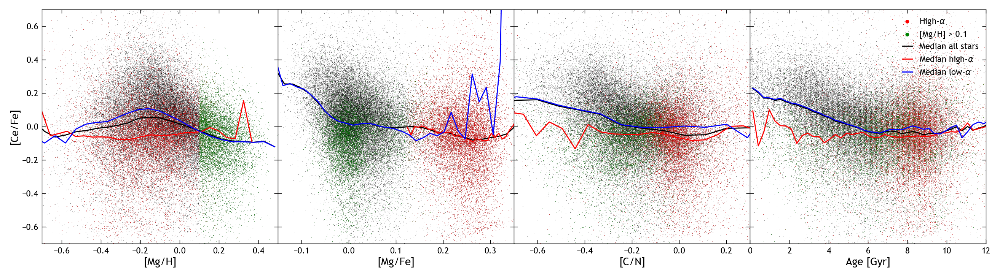

In [44]:
kwargs = dict(s=0.5, marker='.', rasterized=True, edgecolor='none')

fig, axs = plt.subplots(1, 4, figsize=(16, 4), sharey=True, gridspec_kw={'wspace': 0.})

xcols = ['mg_h', 'mg_fe', 'c_n', 'age']
ycol = 'ce_fe'
for i, xcol in enumerate(xcols):
    # Full sample
    axs[i].scatter(mwm_rgb_local[xcol], mwm_rgb_local[ycol], c='k', **kwargs)
    # High-alpha
    axs[i].scatter(local_high_alpha[xcol], local_high_alpha[ycol], c='r', **kwargs, label=r'High-$\alpha$')
    # Local metal-rich
    axs[i].scatter(local_metal_rich[xcol], local_metal_rich[ycol], c='g', **kwargs, label='[Mg/H] > 0.1')
    # Median trends
    axs[i].plot(*binned_medians(mwm_rgb_local, ycol, xcol), 'k-', label=r'Median all stars')
    axs[i].plot(*binned_medians(local_high_alpha, ycol, xcol), 'r-', label=r'Median high-$\alpha$')
    axs[i].plot(*binned_medians(local_low_alpha, ycol, xcol), 'b-', label=r'Median low-$\alpha$')

axs[0].set_ylabel('[Ce/Fe]')
axs[0].set_xlabel('[Mg/H]')
axs[1].set_xlabel('[Mg/Fe]')
axs[2].set_xlabel('[C/N]')
axs[3].set_xlabel('Age [Gyr]')

axs[0].set_ylim((-0.7, 0.7))
axs[0].set_xlim((-0.7, 0.5))
axs[1].set_xlim((-0.15, 0.35))
axs[2].set_xlim((-0.7, 0.3))
axs[3].set_xlim((0, 12))

axs[3].legend(markerscale=10, loc='upper right')

plt.show()

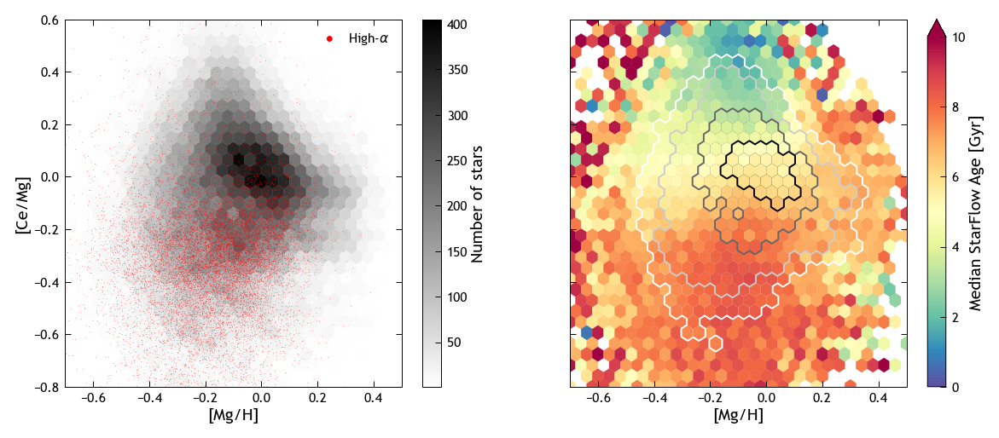

In [27]:
gridsize = 30
xlim = (-0.7, 0.5)
ylim = (-0.8, 0.6)

fig, axs = plt.subplots(1, 2, figsize=(10, 4), dpi=140, sharex=True, sharey=True)

# Plot number density
pcm0 = axs[0].hexbin(
    mwm_rgb_local['mg_h'], mwm_rgb_local['ce_mg'], 
    C=np.ones(mwm_rgb_local.shape[0]),
    reduce_C_function=np.sum,
    gridsize=gridsize, cmap='binary', linewidths=0.2,
    extent=[xlim[0], xlim[1], ylim[0], ylim[1]]
)
# Indicate high-alpha stars
axs[0].scatter(
    local_high_alpha['mg_h'], local_high_alpha['ce_mg'], 
    s=0.5, marker='.', rasterized=True, edgecolor='none', c='r',
    label = r'High-$\alpha$'
)
cbar = fig.colorbar(pcm0, ax=axs[0], orientation='vertical')
cbar.ax.set_ylabel('Number of stars')
axs[0].legend(frameon=False, markerscale=10)

# Plot median age
cfg = dict(
    x=mwm_rgb_local['mg_h'], 
    y=mwm_rgb_local['ce_mg'], 
    C=mwm_rgb_local['age'],
    reduce_C_function=np.median,
    gridsize=gridsize, 
    cmap='Spectral_r',
    extent=[xlim[0], xlim[1], ylim[0], ylim[1]]
)
pcm1 = axs[1].hexbin(**cfg, linewidths=0.2, zorder=1, vmin=0, vmax=10)
cfg = {**cfg, 'vmin': pcm1.get_clim()[0], 'vmax': pcm1.get_clim()[1]}
# draw thick white contours
contours = [50, 100, 200, 300]
# colors = ['#cccccc', '#999999', '#666666', '#333333', '#000000']
colors = get_color_list(plt.get_cmap('binary'), contours + [1000])
for i, count in enumerate(contours):
    axs[1].hexbin(edgecolors=colors[i], lw=2, zorder=i+1, mincnt=count, **cfg)
    axs[1].hexbin(edgecolors='none', lw=0.2, zorder=i+2, mincnt=count, **cfg)
cbar = fig.colorbar(pcm1, ax=axs[1], orientation='vertical', extend='max')
cbar.ax.set_ylabel('Median StarFlow Age [Gyr]')

axs[0].set_xlabel('[Mg/H]')
axs[1].set_xlabel('[Mg/H]')
axs[0].set_ylabel('[Ce/Mg]')
axs[0].set_xlim(xlim)
axs[0].set_ylim(ylim)
plt.show()

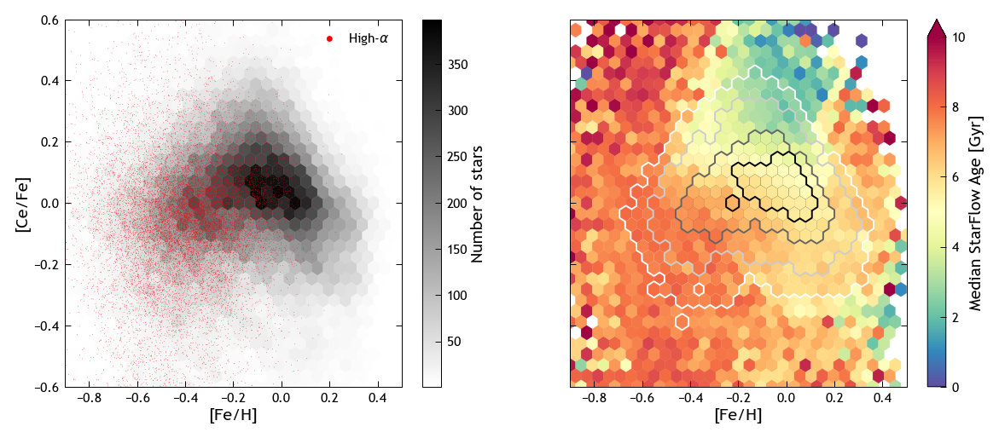

In [28]:
gridsize = 30
xlim = (-0.9, 0.5)
ylim = (-0.6, 0.6)

fig, axs = plt.subplots(1, 2, figsize=(10, 4), dpi=140, sharex=True, sharey=True)

# Plot number density
pcm0 = axs[0].hexbin(
    mwm_rgb_local['fe_h'], mwm_rgb_local['ce_fe'], 
    C=np.ones(mwm_rgb_local.shape[0]),
    reduce_C_function=np.sum,
    gridsize=gridsize, cmap='binary', linewidths=0.2,
    extent=[xlim[0], xlim[1], ylim[0], ylim[1]]
)
# Indicate high-alpha stars
axs[0].scatter(
    local_high_alpha['fe_h'], local_high_alpha['ce_fe'], 
    s=0.5, marker='.', rasterized=True, edgecolor='none', c='r',
    label = r'High-$\alpha$'
)
cbar = fig.colorbar(pcm0, ax=axs[0], orientation='vertical')
cbar.ax.set_ylabel('Number of stars')
axs[0].legend(frameon=False, markerscale=10)

# Plot median age
cfg = dict(
    x=mwm_rgb_local['fe_h'], 
    y=mwm_rgb_local['ce_fe'], 
    C=mwm_rgb_local['age'],
    reduce_C_function=np.median,
    gridsize=gridsize, 
    cmap='Spectral_r',
    extent=[xlim[0], xlim[1], ylim[0], ylim[1]]
)
pcm1 = axs[1].hexbin(**cfg, linewidths=0.2, zorder=1, vmin=0, vmax=10)
cfg = {**cfg, 'vmin': pcm1.get_clim()[0], 'vmax': pcm1.get_clim()[1]}
# draw thick white contours
contours = [50, 100, 200, 300]
# colors = ['#cccccc', '#999999', '#666666', '#333333', '#000000']
colors = get_color_list(plt.get_cmap('binary'), contours + [1000])
for i, count in enumerate(contours):
    axs[1].hexbin(edgecolors=colors[i], lw=2, zorder=i+1, mincnt=count, **cfg)
    axs[1].hexbin(edgecolors='none', lw=0.2, zorder=i+2, mincnt=count, **cfg)
cbar = fig.colorbar(pcm1, ax=axs[1], orientation='vertical', extend='max')
cbar.ax.set_ylabel('Median StarFlow Age [Gyr]')

axs[0].set_xlabel('[Fe/H]')
axs[1].set_xlabel('[Fe/H]')
axs[0].set_ylabel('[Ce/Fe]')
axs[0].set_xlim(xlim)
axs[0].set_ylim(ylim)
plt.show()

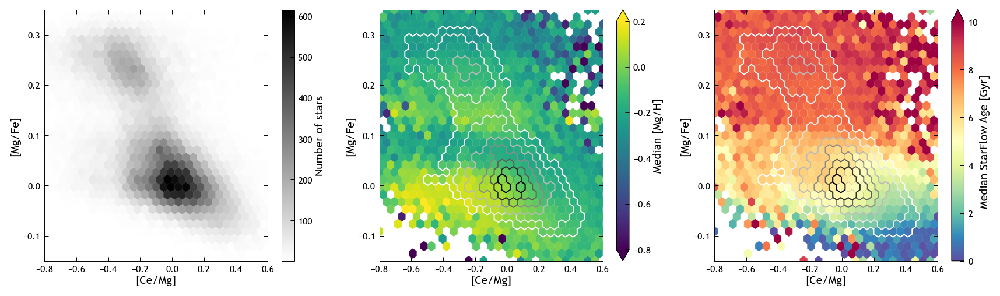

In [29]:
gridsize = 30
ylim = (-0.15, 0.35)
xlim = (-0.8, 0.6)

fig, axs = plt.subplots(1, 3, figsize=(15, 4), dpi=140, sharex=True)

# Plot number density
pcm0 = axs[0].hexbin(
    mwm_rgb_local['ce_mg'], mwm_rgb_local['mg_fe'], 
    C=np.ones(mwm_rgb_local.shape[0]),
    reduce_C_function=np.sum,
    gridsize=gridsize, cmap='binary', linewidths=0.2,
    extent=[xlim[0], xlim[1], ylim[0], ylim[1]]
)
cbar = fig.colorbar(pcm0, ax=axs[0], orientation='vertical')
cbar.ax.set_ylabel('Number of stars')

# Color by metallicity
cfg = dict(
    x=mwm_rgb_local['ce_mg'], 
    y=mwm_rgb_local['mg_fe'], 
    C=mwm_rgb_local['mg_h'],
    reduce_C_function=np.median,
    gridsize=gridsize, 
    cmap='viridis',
    extent=[xlim[0], xlim[1], ylim[0], ylim[1]]
)
pcm1 = axs[1].hexbin(**cfg, linewidths=0.2, zorder=1, vmin=-0.8, vmax=0.2)
cfg = {**cfg, 'vmin': pcm1.get_clim()[0], 'vmax': pcm1.get_clim()[1]}
# draw thick white contours
contours = [50, 100, 200, 300, 400, 500, 600]
colors = get_color_list(plt.get_cmap('binary'), contours + [1000])
for i, count in enumerate(contours):
    axs[1].hexbin(edgecolors=colors[i], lw=2, zorder=i+1, mincnt=count, **cfg)
    axs[1].hexbin(edgecolors='none', lw=0.2, zorder=i+2, mincnt=count, **cfg)
cbar = fig.colorbar(pcm1, ax=axs[1], orientation='vertical', extend='both')
cbar.ax.set_ylabel('Median [Mg/H]')

# Color by median [C/N]
cfg = dict(
    x=mwm_rgb_local['ce_mg'], 
    y=mwm_rgb_local['mg_fe'], 
    C=mwm_rgb_local['age'],
    reduce_C_function=np.median,
    gridsize=gridsize, 
    cmap='Spectral_r',
    extent=[xlim[0], xlim[1], ylim[0], ylim[1]]
)
pcm1 = axs[2].hexbin(**cfg, linewidths=0.2, zorder=1, vmin=0, vmax=10)
cfg = {**cfg, 'vmin': pcm1.get_clim()[0], 'vmax': pcm1.get_clim()[1]}
# draw thick white contours
colors = get_color_list(plt.get_cmap('binary'), contours + [1000])
for i, count in enumerate(contours):
    axs[2].hexbin(edgecolors=colors[i], lw=2, zorder=i+1, mincnt=count, **cfg)
    axs[2].hexbin(edgecolors='none', lw=0.2, zorder=i+2, mincnt=count, **cfg)
cbar = fig.colorbar(pcm1, ax=axs[2], orientation='vertical', extend='max')
cbar.ax.set_ylabel('Median StarFlow Age [Gyr]')

axs[0].set_xlabel('[Ce/Mg]')
axs[1].set_xlabel('[Ce/Mg]')
axs[2].set_xlabel('[Ce/Mg]')
axs[0].set_ylabel('[Mg/Fe]')
axs[1].set_ylabel('[Mg/Fe]')
axs[2].set_ylabel('[Mg/Fe]')
axs[0].set_xlim(xlim)
axs[0].set_ylim(ylim)
axs[1].set_ylim(ylim)
axs[2].set_ylim(ylim)
plt.show()

## Across the disk

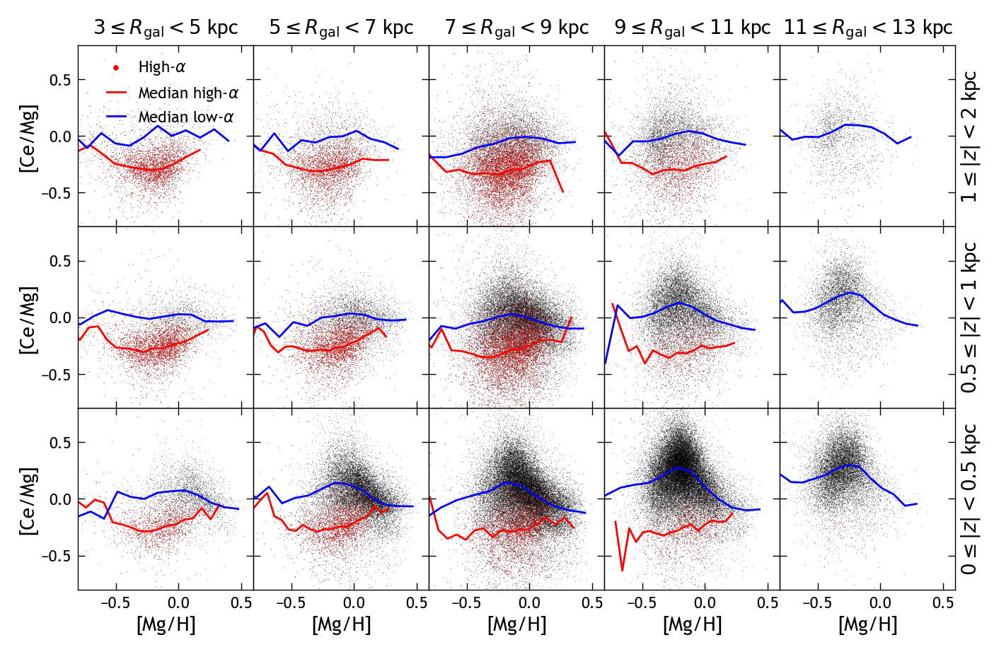

In [36]:
galr_bins = np.arange(3, 15, 2)
absz_bins = [0, 0.5, 1, 2]
alpha_buffer = 0.02

kwargs = dict(s=0.3, marker='.', rasterized=True, edgecolor='none')

fig, axs = plt.subplots(
    len(absz_bins)-1, len(galr_bins)-1,
    figsize=(8, 5), sharex=True, sharey=True,
    gridspec_kw={'hspace': 0, 'wspace': 0},
    dpi=200
)

for i, row in enumerate(axs):
    absz_lim = (absz_bins[-(i+2)], absz_bins[-(i+1)])
    for j, ax in enumerate(row):
        galr_lim = (galr_bins[j], galr_bins[j+1])
        subset = mwm_rgb[
            (mwm_rgb['gal_r'] >= galr_lim[0]) &
            (mwm_rgb['gal_r'] < galr_lim[1]) &
            (mwm_rgb['gal_z'].abs() >= absz_lim[0]) &
            (mwm_rgb['gal_z'].abs() < absz_lim[1])
        ]
        ax.scatter(subset['mg_h'], subset['ce_mg'], c='k', **kwargs)
        high_alpha = subset[
            subset['mg_fe'] > alpha_cut(subset['fe_h']) + alpha_buffer
        ]
        low_alpha = subset[
            subset['mg_fe'] < alpha_cut(subset['fe_h']) - alpha_buffer
        ]
        ax.scatter(high_alpha['mg_h'], high_alpha['ce_mg'], c='r', 
                   label=r'High-$\alpha$', **kwargs)
        # Plot median trends
        if high_alpha.shape[0] >= 200:
            ax.plot(*binned_medians(high_alpha, 'ce_mg', 'mg_h', 20), 'r-',
                    label=r'Median high-$\alpha$')
        if low_alpha.shape[0] >= 200:
            ax.plot(*binned_medians(low_alpha, 'ce_mg', 'mg_h', 20), 'b-',
                    label=r'Median low-$\alpha$')

# Format axes
axs[0,0].set_xlim((-0.8, 0.6))
axs[0,0].set_ylim((-0.8, 0.8))
for ax in axs[-1,:]:
    ax.set_xlabel('[Mg/H]')
for i, ax in enumerate(axs[0,:]):
    ax.set_title(r'$%s\leq R_{\rm gal}<%s$ kpc' % (galr_bins[i], galr_bins[i+1]), fontsize=10)
for ax in axs[:,0]:
    ax.set_ylabel('[Ce/Mg]')
for i, ax in enumerate(axs[:,-1]):
    ax.yaxis.set_label_position('right')
    ax.set_ylabel(r'$%s\leq |z|<%s$ kpc' % (absz_bins[-(i+2)], absz_bins[-(i+1)]))
axs[0,0].legend(markerscale=10)

plt.show()

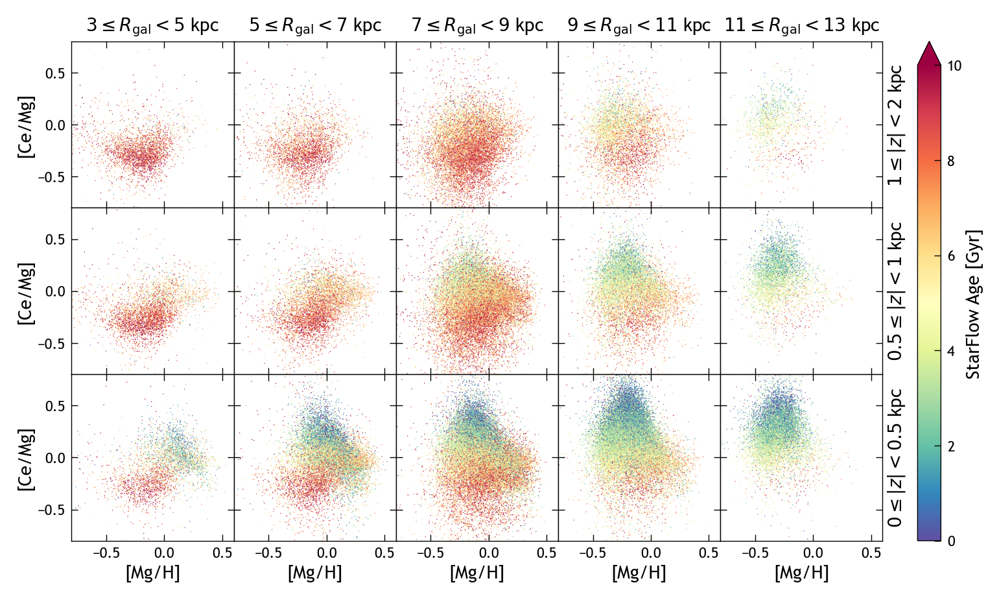

In [27]:
galr_bins = np.arange(3, 15, 2)
absz_bins = [0, 0.5, 1, 2]
alpha_buffer = 0.02

kwargs = dict(s=1, marker='.', rasterized=True, edgecolor='none')

fig, axs = plt.subplots(
    len(absz_bins)-1, len(galr_bins)-1,
    figsize=(9, 5), sharex=True, sharey=True,
    gridspec_kw={'hspace': 0, 'wspace': 0},
    dpi=200
)

for i, row in enumerate(axs):
    absz_lim = (absz_bins[-(i+2)], absz_bins[-(i+1)])
    for j, ax in enumerate(row):
        galr_lim = (galr_bins[j], galr_bins[j+1])
        subset = mwm_rgb[
            (mwm_rgb['gal_r'] >= galr_lim[0]) &
            (mwm_rgb['gal_r'] < galr_lim[1]) &
            (mwm_rgb['gal_z'].abs() >= absz_lim[0]) &
            (mwm_rgb['gal_z'].abs() < absz_lim[1])
        ]
        pc = ax.scatter(subset['mg_h'], subset['ce_mg'], c=subset['age'], 
                   vmin=0, vmax=10, cmap='Spectral_r', **kwargs)

# Format axes
axs[0,0].set_xlim((-0.8, 0.6))
axs[0,0].set_ylim((-0.8, 0.8))
for ax in axs[-1,:]:
    ax.set_xlabel('[Mg/H]')
for i, ax in enumerate(axs[0,:]):
    ax.set_title(r'$%s\leq R_{\rm gal}<%s$ kpc' % (galr_bins[i], galr_bins[i+1]), fontsize=10)
for ax in axs[:,0]:
    ax.set_ylabel('[Ce/Mg]')
for i, ax in enumerate(axs[:,-1]):
    ax.yaxis.set_label_position('right')
    ax.set_ylabel(r'$%s\leq |z|<%s$ kpc' % (absz_bins[-(i+2)], absz_bins[-(i+1)]))

# Colorbar
width = 0.02
pad = 0.03
plt.subplots_adjust(right=fig.subplotpars.right - (width + pad + 0.03))
height = fig.subplotpars.top - fig.subplotpars.bottom
cax = plt.axes([fig.subplotpars.right + pad, fig.subplotpars.bottom, 
                width, height])
fig.colorbar(pc, cax=cax, extend='max', label='StarFlow Age [Gyr]')

plt.show()

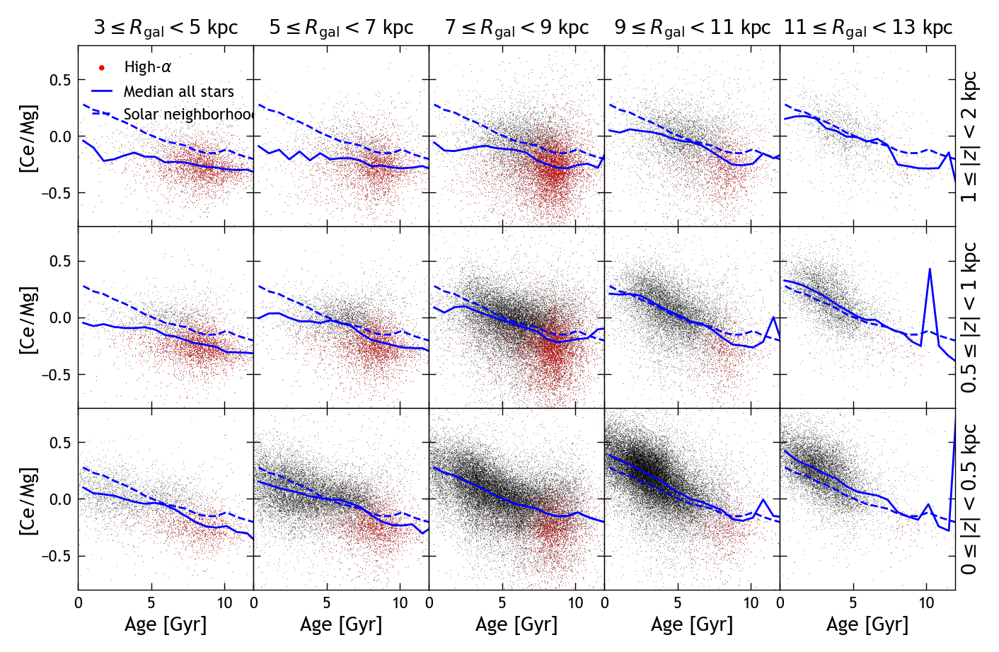

In [ ]:
galr_bins = np.arange(3, 15, 2)
absz_bins = [0, 0.5, 1, 2]
alpha_buffer = 0.02

kwargs = dict(s=0.3, marker='.', rasterized=True, edgecolor='none')

local_subset = mwm_rgb[
    (mwm_rgb['gal_r'] >= 7) &
    (mwm_rgb['gal_r'] < 9) &
    (mwm_rgb['gal_z'].abs() < 0.5)
]

fig, axs = plt.subplots(
    len(absz_bins)-1, len(galr_bins)-1,
    figsize=(8, 5), sharex=True, sharey=True,
    gridspec_kw={'hspace': 0, 'wspace': 0},
)

for i, row in enumerate(axs):
    absz_lim = (absz_bins[-(i+2)], absz_bins[-(i+1)])
    for j, ax in enumerate(row):
        galr_lim = (galr_bins[j], galr_bins[j+1])
        subset = mwm_rgb[
            (mwm_rgb['gal_r'] >= galr_lim[0]) &
            (mwm_rgb['gal_r'] < galr_lim[1]) &
            (mwm_rgb['gal_z'].abs() >= absz_lim[0]) &
            (mwm_rgb['gal_z'].abs() < absz_lim[1])
        ]
        ax.scatter(subset['age'], subset['ce_mg'], c='k', **kwargs)
        high_alpha = subset[
            subset['mg_fe'] > alpha_cut(subset['fe_h']) + alpha_buffer
        ]
        low_alpha = subset[
            subset['mg_fe'] < alpha_cut(subset['fe_h']) - alpha_buffer
        ]
        ax.scatter(high_alpha['age'], high_alpha['ce_mg'], c='r', 
                   label=r'High-$\alpha$', **kwargs)
        # Plot median trends
        ax.plot(*binned_medians(subset, 'ce_mg', 'age', 20), 'b-',
                label=r'Median all stars')
        # Local medians for comparison
        ax.plot(*binned_medians(local_subset, 'ce_mg', 'age', 20), 'b--',
                label='Solar neighborhood')

# Format axes
axs[0,0].set_xlim((0, 12))
axs[0,0].set_ylim((-0.8, 0.8))
for ax in axs[-1,:]:
    ax.set_xlabel('Age [Gyr]')
for i, ax in enumerate(axs[0,:]):
    ax.set_title(r'$%s\leq R_{\rm gal}<%s$ kpc' % (galr_bins[i], galr_bins[i+1]), fontsize=10)
for ax in axs[:,0]:
    ax.set_ylabel('[Ce/Mg]')
for i, ax in enumerate(axs[:,-1]):
    ax.yaxis.set_label_position('right')
    ax.set_ylabel(r'$%s\leq |z|<%s$ kpc' % (absz_bins[-(i+2)], absz_bins[-(i+1)]))
axs[0,0].legend(markerscale=10)

plt.show()

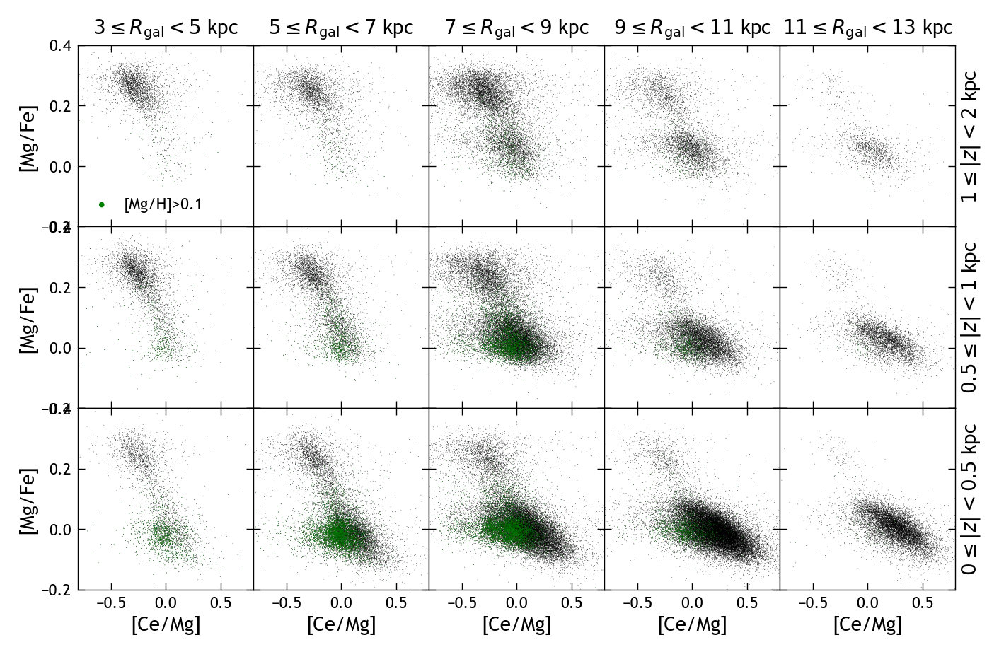

In [30]:
galr_bins = np.arange(3, 15, 2)
absz_bins = [0, 0.5, 1, 2]
alpha_buffer = 0.02

kwargs = dict(s=0.3, marker='.', rasterized=True, edgecolor='none')

fig, axs = plt.subplots(
    len(absz_bins)-1, len(galr_bins)-1,
    figsize=(8, 5), sharex=True, sharey=True,
    gridspec_kw={'hspace': 0, 'wspace': 0}
)

for i, row in enumerate(axs):
    absz_lim = (absz_bins[-(i+2)], absz_bins[-(i+1)])
    for j, ax in enumerate(row):
        galr_lim = (galr_bins[j], galr_bins[j+1])
        subset = mwm_rgb[
            (mwm_rgb['gal_r'] >= galr_lim[0]) &
            (mwm_rgb['gal_r'] < galr_lim[1]) &
            (mwm_rgb['gal_z'].abs() >= absz_lim[0]) &
            (mwm_rgb['gal_z'].abs() < absz_lim[1])
        ]
        ax.scatter(subset['ce_mg'], subset['mg_fe'], c='k', **kwargs)
        # high_alpha = subset[
        #     subset['mg_fe'] > alpha_cut(subset['fe_h']) + alpha_buffer
        # ]
        # ax.scatter(high_alpha['ce_mg'], high_alpha['mg_fe'], c='r', 
        #            label=r'High-$\alpha$', **kwargs)
        metal_rich = subset[subset['mg_h'] > 0.1]
        ax.scatter(metal_rich['ce_mg'], metal_rich['mg_fe'], c='g',
                   label='[Mg/H]>0.1', **kwargs)

# Format axes
axs[0,0].set_xlim((-0.8, 0.8))
axs[0,0].set_ylim((-0.2, 0.4))
for ax in axs[-1,:]:
    ax.set_xlabel('[Ce/Mg]')
for i, ax in enumerate(axs[0,:]):
    ax.set_title(r'$%s\leq R_{\rm gal}<%s$ kpc' % (galr_bins[i], galr_bins[i+1]), fontsize=10)
for ax in axs[:,0]:
    ax.set_ylabel('[Mg/Fe]')
for i, ax in enumerate(axs[:,-1]):
    ax.yaxis.set_label_position('right')
    ax.set_ylabel(r'$%s\leq |z|<%s$ kpc' % (absz_bins[-(i+2)], absz_bins[-(i+1)]))
axs[0,0].legend(markerscale=10)

plt.show()